In [1]:
from wcs.service import WebCoverageService
from wcps.model import Datacube, Axis
from wcps.service import Service
from wcps.spectral import NDVI

from dotenv import load_dotenv
from pathlib import Path
import os

import elapid as ela
import numpy as np
import pandas as pd
import rasterio
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
import warnings
import rasterio as rio
from shapely import wkt

In [2]:
env_path = Path('.') / 'env_secrets.txt'
load_dotenv(dotenv_path=env_path)

rasdaman_username = os.getenv("RASDAMAN_CRED_USERNAME")
rasdaman_password = os.getenv("RASDAMAN_CRED_PASSWORD")
rasdaman_endpoint = os.getenv("RASDAMAN_SERVICE_ENDPOINT")

In [3]:
wcs_endpoint = "https://fairicube.rasdaman.com/rasdaman/ows"
service = WebCoverageService(wcs_endpoint)

coverages = service.list_coverages()
coverages

{'AD4GD_GBIF': BasicCoverage(),
 'ADC_Arable_Land_Markers_Autumn': BasicCoverage(),
 'ADC_Arable_Land_Markers_Spring': BasicCoverage(),
 'ADC_Crop_Parcels_Crop_Code': BasicCoverage(),
 'ADC_Crop_Parcels_Field_ID': BasicCoverage(),
 'ADC_Crop_Rotation_Index': BasicCoverage(),
 'ADC_Grassland_Markers_NDVI_Spring': BasicCoverage(),
 'ADC_Grassland_Markers_No_Mowing': BasicCoverage(),
 'ADC_arable_land_markers_no_ndvi': BasicCoverage(),
 'LGN': BasicCoverage(),
 'LGN_Monitoring': BasicCoverage(),
 'Precipitation_Netherlands': BasicCoverage(),
 'S2_L2A_Netherlands_CloudFree': BasicCoverage(),
 'Temperature_Netherlands': BasicCoverage(),
 'corine_land_cover': BasicCoverage(),
 'dominant_leaf_type_10m': BasicCoverage(),
 'dominant_leaf_type_20m': BasicCoverage(),
 'eu_demography': BasicCoverage(),
 'european_settlement_map_2015': BasicCoverage(),
 'european_settlement_map_2018': BasicCoverage(),
 'forest_type_10m': BasicCoverage(),
 'forest_type_20m': BasicCoverage(),
 'global_pesticide_grids

In [4]:
## Import environmental data - NEEDS TO BE CHANGED FOR DIFFERENT REGIONS AND YEARS ##
## "X": 168910 : 194950, "Y": 513945 : 535555 for arable region ##
## "X": 143140 : 182350, "Y": 439525 : 482745 for grassland region ##
## Don't forget to change the year ##

# LGN
LGN_mon = Datacube("LGN_Monitoring")["X": 168910 : 194950, "Y": 513945 : 535555, "time":"2018-01-01"]
query = LGN_mon.encode("TIFF")
service = Service("https://fairicube.rasdaman.com/rasdaman/ows", username = rasdaman_username, password = rasdaman_password)
service.download(query, output_file = "LGN_monitoring.tif")

# NDVI_feb
cov = Datacube("S2_L2A_Netherlands_CloudFree")["X": 168910 : 194950, "Y": 513945 : 535555, "time": "2018-02"]
ndvi = NDVI(N=cov.nir, R=cov.red)
query = ndvi.encode("tiff")
service = Service("https://fairicube.rasdaman.com/rasdaman/ows", username = rasdaman_username, password = rasdaman_password)
service.download(query, output_file="NDVI_feb.tif")

# NDVI_apr
cov = Datacube("S2_L2A_Netherlands_CloudFree")["X": 168910 : 194950, "Y": 513945 : 535555, "time": "2018-04"]
ndvi = NDVI(N=cov.nir, R=cov.red)
query = ndvi.encode("tiff")
service = Service("https://fairicube.rasdaman.com/rasdaman/ows", username = rasdaman_username, password = rasdaman_password)
service.download(query, output_file="NDVI_apr.tif")

# NDVI_jun
cov = Datacube("S2_L2A_Netherlands_CloudFree")["X": 168910 : 194950, "Y": 513945 : 535555, "time": "2018-06"]
ndvi = NDVI(N=cov.nir, R=cov.red)
query = ndvi.encode("tiff")
service = Service("https://fairicube.rasdaman.com/rasdaman/ows", username = rasdaman_username, password = rasdaman_password)
service.download(query, output_file="NDVI_jun.tif")

# NDVI_sep
cov = Datacube("S2_L2A_Netherlands_CloudFree")["X": 168910 : 194950, "Y": 513945 : 535555, "time": "2018-09"]
ndvi = NDVI(N=cov.nir, R=cov.red)
query = ndvi.encode("tiff")
service = Service("https://fairicube.rasdaman.com/rasdaman/ows", username = rasdaman_username, password = rasdaman_password)
service.download(query, output_file="NDVI_sep.tif")

rasters = [
    "LGN_monitoring.tif",
    "NDVI_feb.tif",
    "NDVI_apr.tif",
    "NDVI_jun.tif",
    "NDVI_sep.tif",
]

labels = [raster[0:-4] for raster in rasters]
labels

['LGN_monitoring', 'NDVI_feb', 'NDVI_apr', 'NDVI_jun', 'NDVI_sep']

In [6]:
## Import bird occurrence data - NEEDS TO BE CHANGED FOR DIFFERENT REGIONS AND YEARS ##

birds = pd.read_csv('birds_arable_2018_abundance_0.5.csv')
birds.rename(columns={"WKT": "geometry"}, inplace=True)
birds['geometry'] = birds['geometry'].apply(wkt.loads)
birds = gpd.GeoDataFrame(birds, geometry='geometry')
birds.set_crs("EPSG:28992", inplace=True)
birds = birds[birds['bird_id_int'] != 99]

id_to_species = {
    0: "Veldleeuwerik",
    1: "Slobeend",
    2: "Graspieper",
    3: "Putter",
    4: "Roek",
    5: "Kwartel",
    6: "Geelgors",
    7: "Torenvalk",
    8: "Watersnip",
    9: "Scholekster",
    10: "Spotvogel",
    11: "Boerenzwaluw",
    12: "Grutto",
    13: "Gele kwikstaart",
    14: "Wulp",
    15: "Ringmus",
    16: "Patrijs",
    17: "Zomertortel",
    18: "Spreeuw",
    19: "Grasmus",
    20: "Tureluur",
    21: "Grote lijster",
    22: "Kievit"
}
birds['bird_species'] = birds['bird_id_int'].map(id_to_species)
birds = birds.drop(columns=['bird_id_int'])

Processing species: Veldleeuwerik


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Veldleeuwerik AUC (test): 0.735
Veldleeuwerik Omission rate (test): 0.269


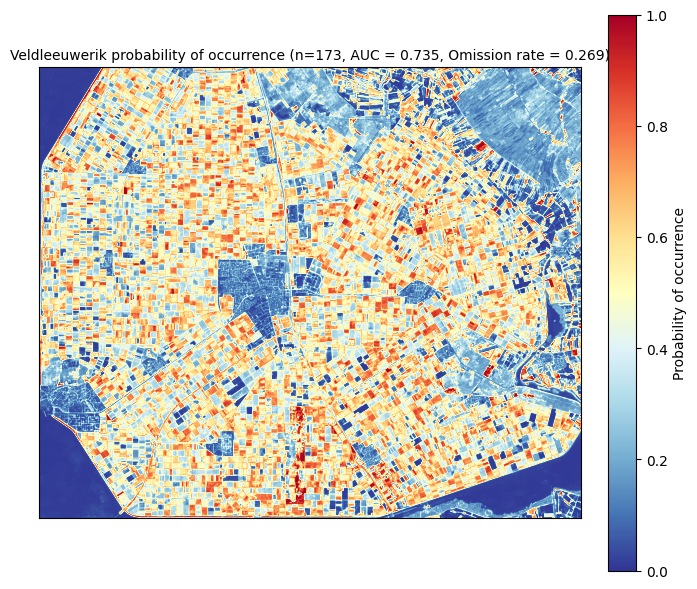

Processing species: Slobeend


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Slobeend AUC (test): 0.871
Slobeend Omission rate (test): 0.389


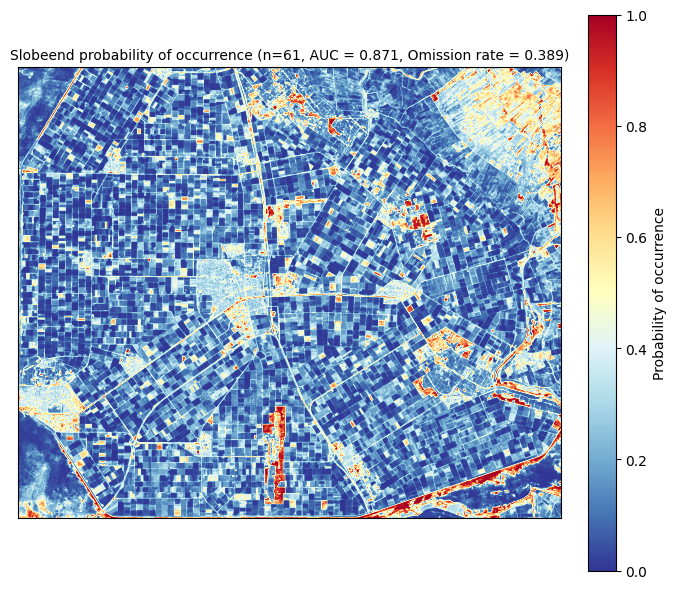

Processing species: Graspieper


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Graspieper AUC (test): 0.660
Graspieper Omission rate (test): 0.319


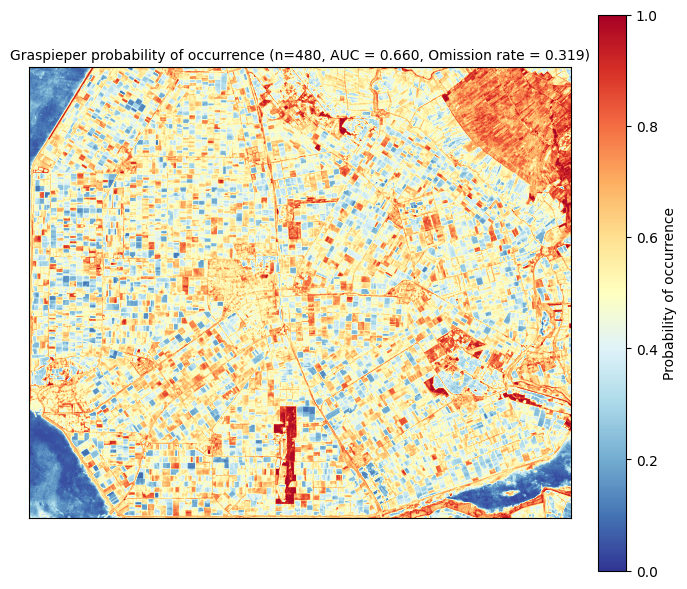

Processing species: Putter


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Putter AUC (test): 0.897
Putter Omission rate (test): 0.361


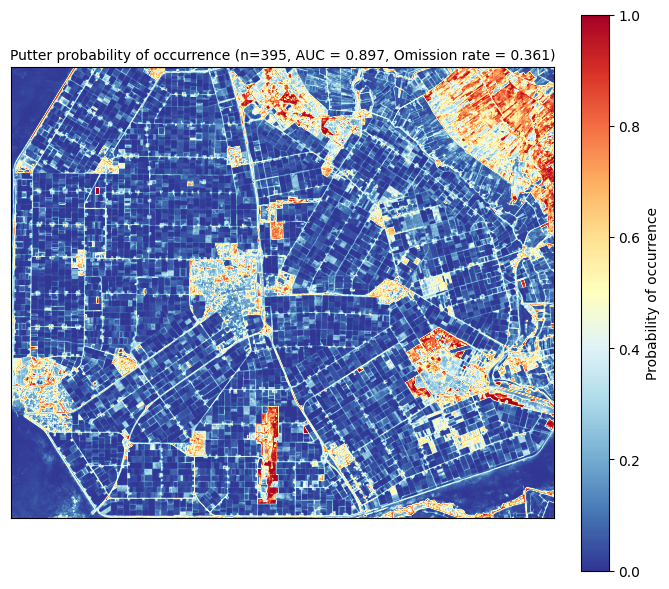

Processing species: Roek


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Roek AUC (test): 0.985
Roek Omission rate (test): 0.000


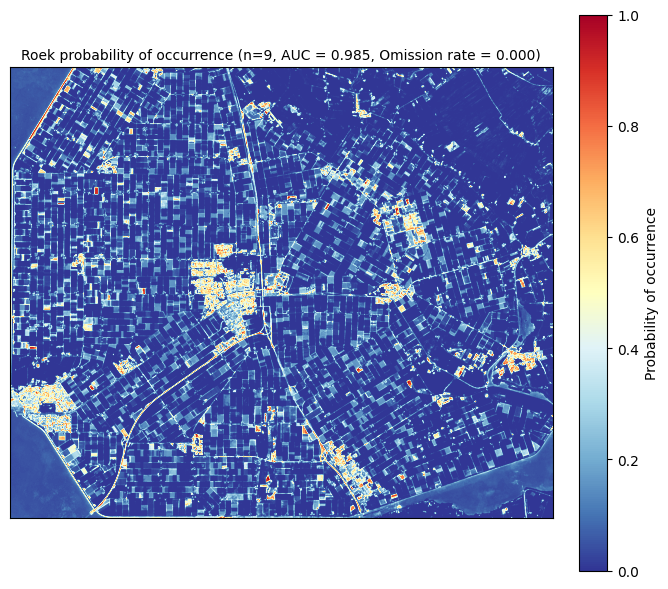

Processing species: Kwartel


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Kwartel AUC (test): 0.771
Kwartel Omission rate (test): 1.000


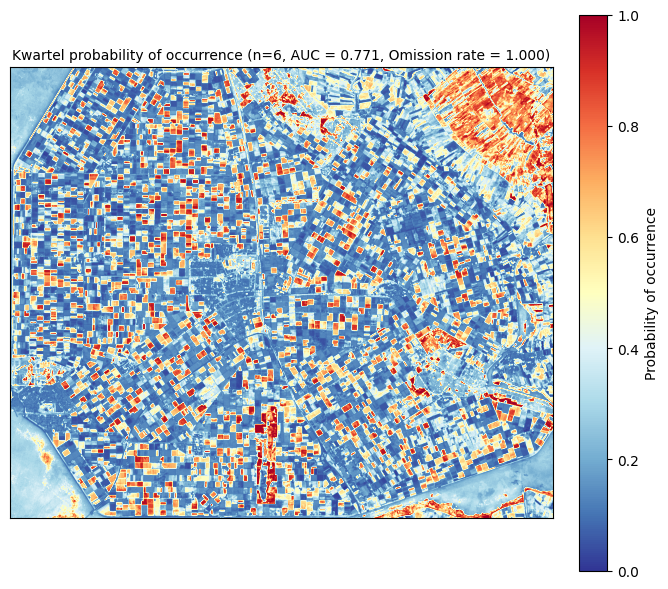

Processing species: Geelgors


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Geelgors AUC (test): 0.960
Geelgors Omission rate (test): 0.000


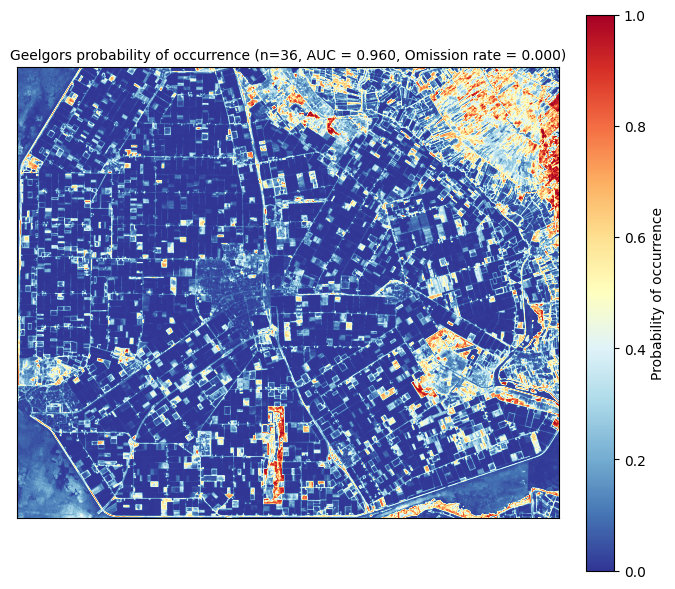

Processing species: Torenvalk


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Torenvalk AUC (test): 0.765
Torenvalk Omission rate (test): 0.356


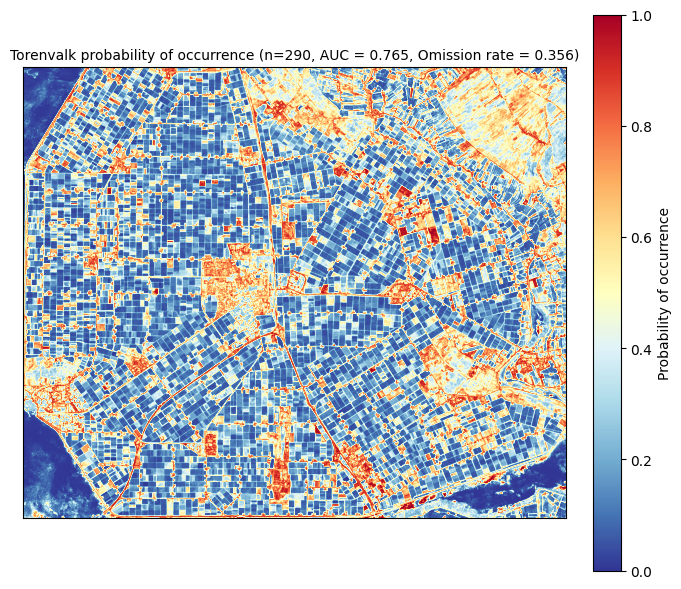

Processing species: Watersnip


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Watersnip AUC (test): 0.861
Watersnip Omission rate (test): 0.377


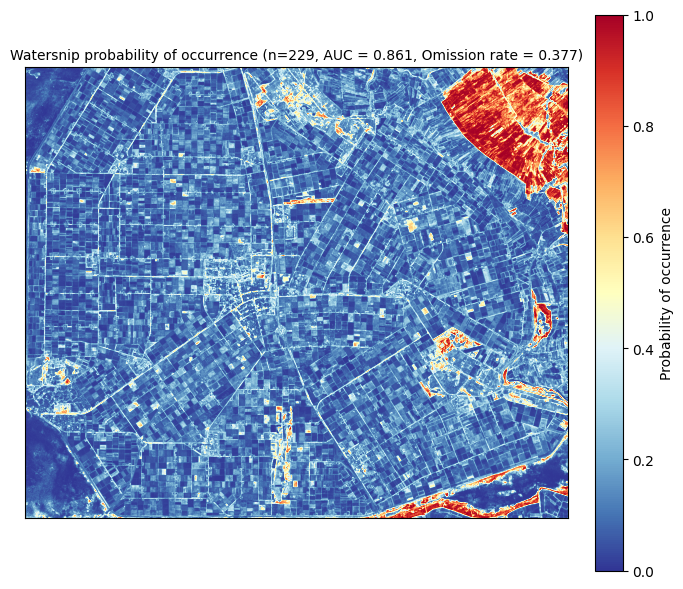

Processing species: Scholekster


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Scholekster AUC (test): 0.815
Scholekster Omission rate (test): 0.254


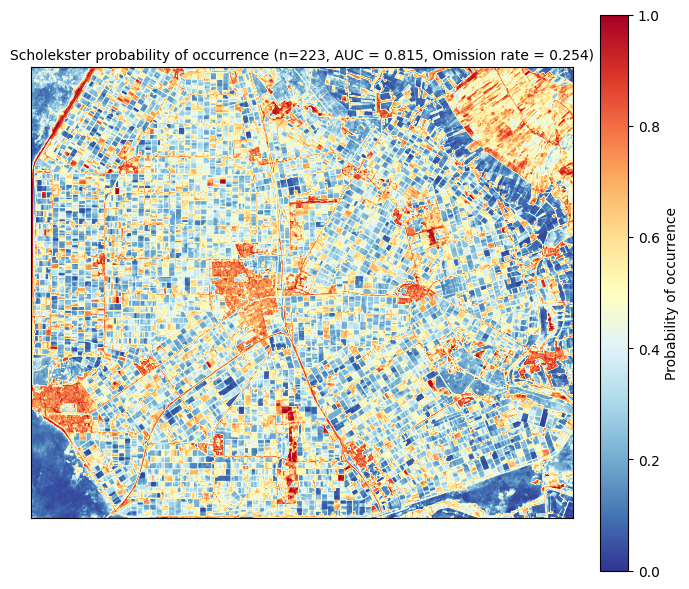

Processing species: Spotvogel


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Spotvogel AUC (test): 0.883
Spotvogel Omission rate (test): 0.450


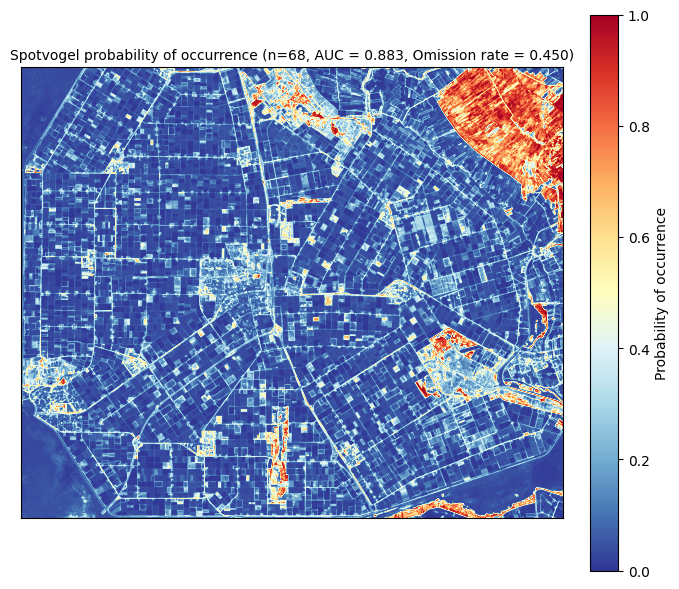

Processing species: Boerenzwaluw


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Boerenzwaluw AUC (test): 0.887
Boerenzwaluw Omission rate (test): 0.235


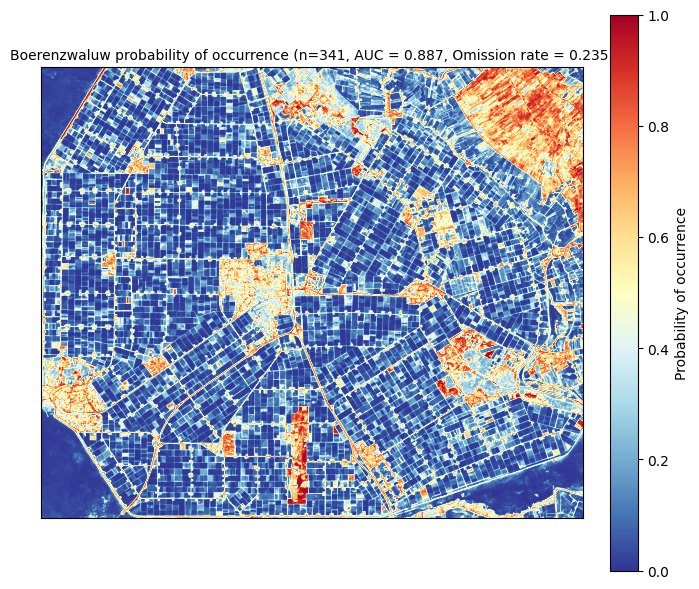

Processing species: Grutto


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Grutto AUC (test): 0.954
Grutto Omission rate (test): 0.231


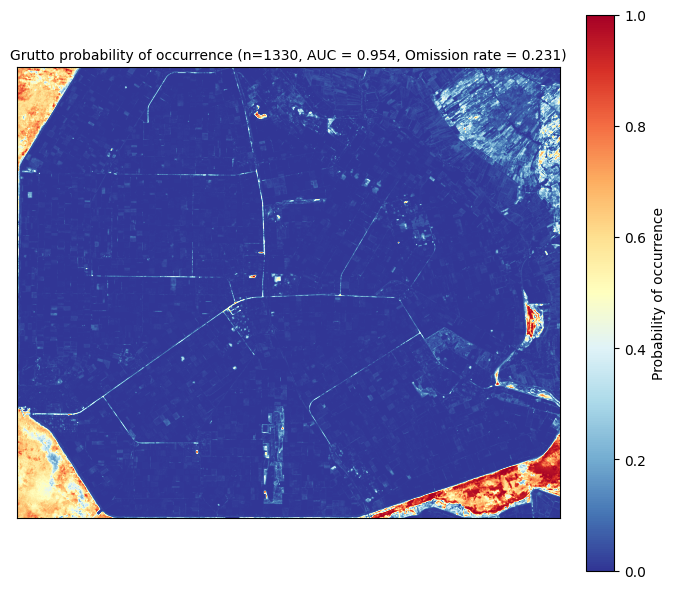

Processing species: Gele kwikstaart


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Gele kwikstaart AUC (test): 0.677
Gele kwikstaart Omission rate (test): 0.185


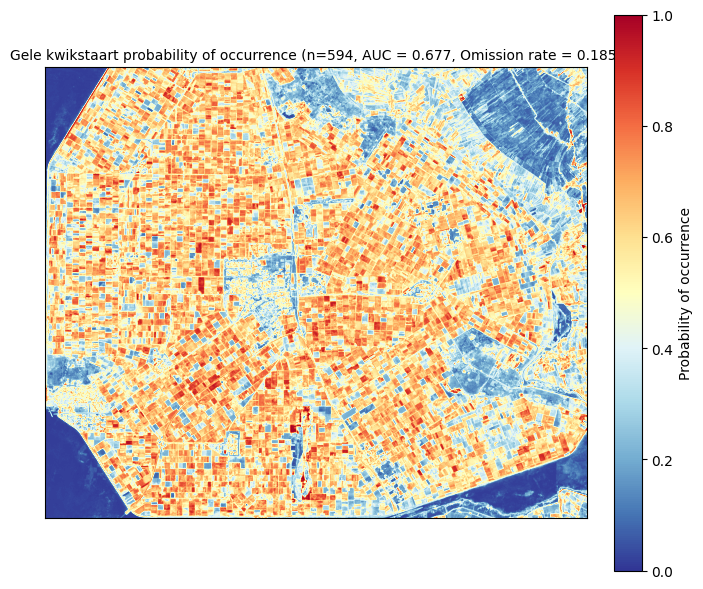

Processing species: Wulp


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Wulp AUC (test): 0.925
Wulp Omission rate (test): 0.364


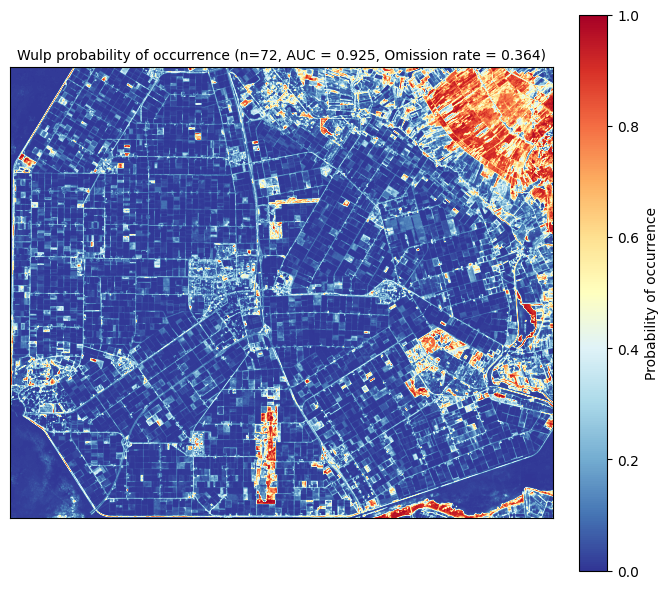

Processing species: Ringmus


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Ringmus AUC (test): 0.823
Ringmus Omission rate (test): 0.246


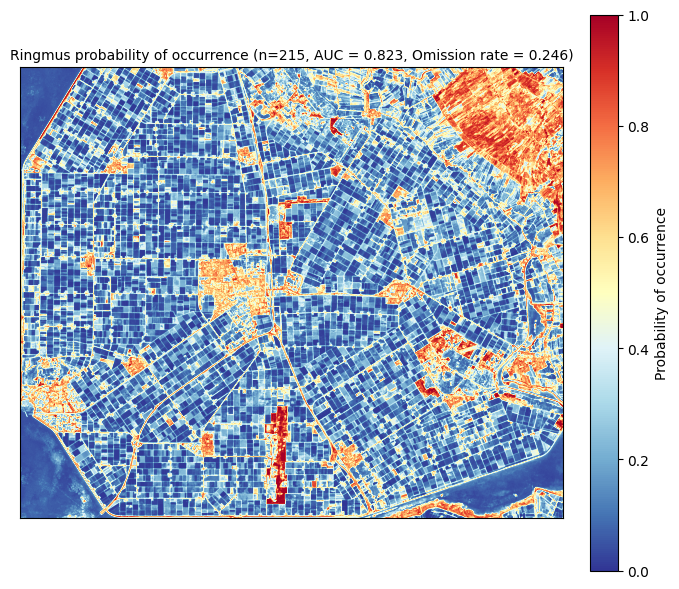

Processing species: Zomertortel


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


⚠️  Zomertortel: Too few observations, model not tested.
Processing species: Spreeuw


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Spreeuw AUC (test): 0.727
Spreeuw Omission rate (test): 0.307


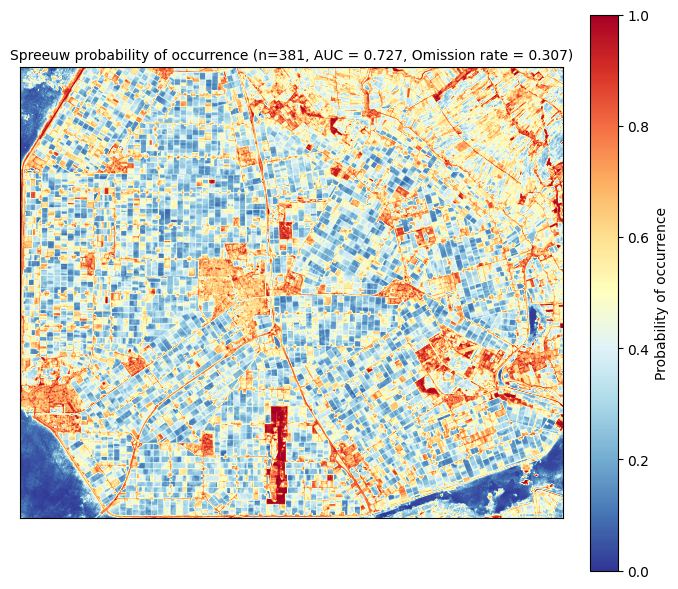

Processing species: Grasmus


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Grasmus AUC (test): 0.944
Grasmus Omission rate (test): 0.179


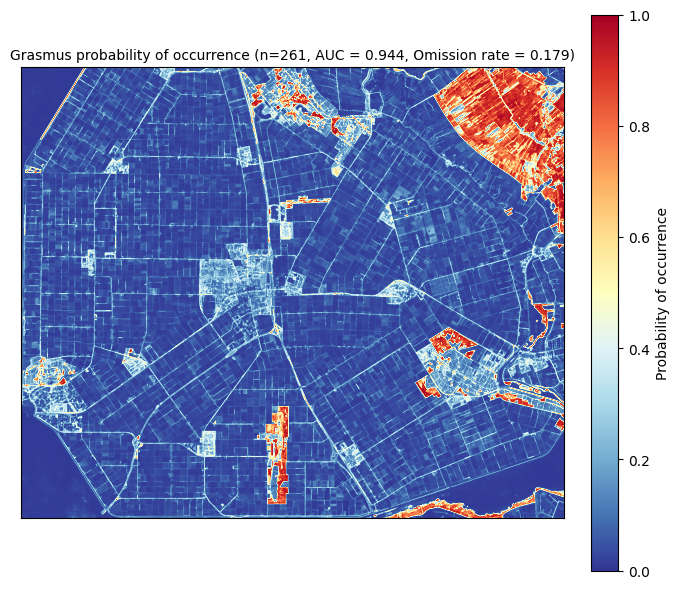

Processing species: Tureluur


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Tureluur AUC (test): 0.834
Tureluur Omission rate (test): 0.463


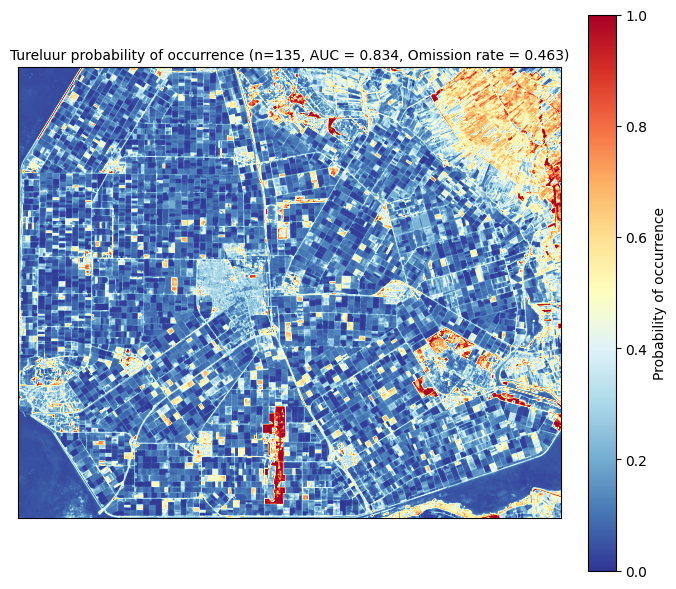

Processing species: Grote lijster


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Grote lijster AUC (test): 0.849
Grote lijster Omission rate (test): 0.412


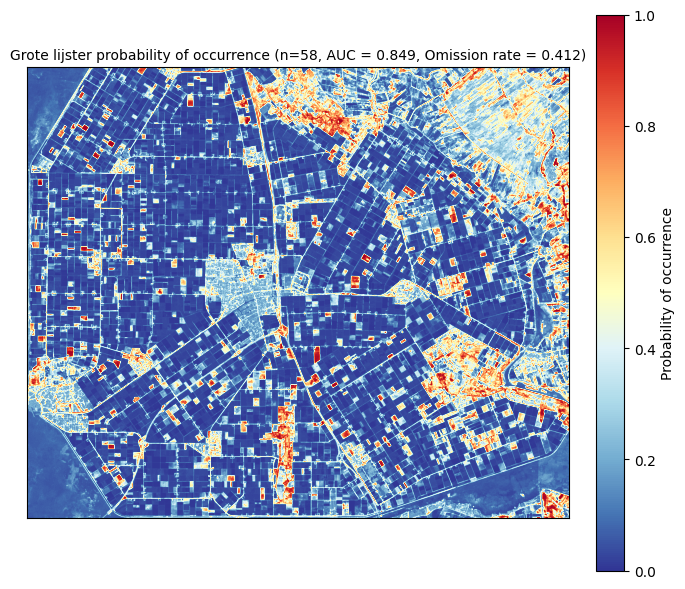

Processing species: Kievit


/home/conda/fairicubeuc2/cd9a36edb0dc3ee807d8480c9bf1b860e5adb8ac735017d90955d1b8f50febd7-20241127-193535-689672-40-sdm-torch/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Kievit AUC (test): 0.609
Kievit Omission rate (test): 0.152


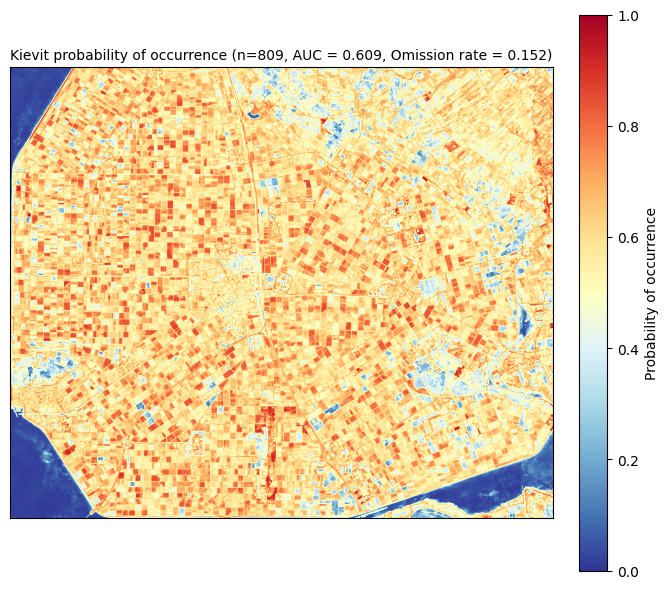

In [7]:
results = []

## Prepare data, train model and predict probability of occurrence for each bird species ##
species_list = birds['bird_species'].unique()

for species in species_list:
    print(f"Processing species: {species}")

    # Select presence for current species (bird_species == species)
    presence = birds.loc[birds['bird_species'] == species]
    background = ela.sample_raster(rasters[0], count=10000)

    # Merge presence + background, add class labels
    merged = ela.stack_geodataframes(presence, background, add_class_label=True)
    
    # Annotate with raster covariates
    annotated = merged[['geometry', 'class']].copy()
    for raster, label in zip(rasters, labels):
        df = ela.annotate(merged, raster_paths=[raster], drop_na=False, quiet=True)
        annotated[label] = df['b1']

    annotated = annotated.dropna()
    
    # Prepare features and labels
    x = annotated.drop(columns=['class', 'geometry'])
    y = annotated['class']

    # Check for sufficient observations to perform a train/test split
    if y.value_counts().min() < 2:
        print(f"⚠️  {species}: Too few observations, model not tested.")
        results.append({
            "Species": species,
            "n": len(presence),
            "AUC": None,
            "Omission rate": None,
            "Note": "Too few observations, model not tested"
        })
        continue

    # Train/test split (70/30 stratified)
    from sklearn.model_selection import train_test_split
    x_train, x_test, y_train, y_test = train_test_split(
        x, y, test_size=0.3, stratify=y, random_state=42
    )

    # Train model
    model = ela.MaxentModel()
    model.fit(x_train, y_train, categorical=[0])  # adjust categorical if needed
    
    # Evaluate on test set
    ypred = model.predict(x_test)
    auc = metrics.roc_auc_score(y_test, ypred)
    print(f"{species} AUC (test): {auc:.3f}")

    ypred_binary = (ypred >= 0.5).astype(int)
    omission_rate = np.sum((y_test == 1) & (ypred_binary == 0)) / np.sum(y_test == 1)
    print(f"{species} Omission rate (test): {omission_rate:.3f}")

    # Save result as list
    results.append({
        "Species": species,
        "n": len(presence),
        "AUC": round(auc, 3),
        "Omission rate": round(omission_rate, 3),
        "Note": ""
    })

    # Predict and save raster
    model_full = ela.MaxentModel()
    model_full.fit(x, y, categorical=[0])
    output_raster = f"MaxEnt_outputs/With abundance filter/{species}_arable_2018_abundance_filter.tif"
    ela.apply_model_to_rasters(model_full, rasters, output_raster, quiet=True)

    # Plot predictions
    with rio.open(output_raster, 'r') as src:
        pred = src.read(1, masked=True)
    
    fig, ax = plt.subplots(figsize=(7,6), dpi=100)
    im = ax.imshow(pred, vmin=0, vmax=1, cmap='RdYlBu_r')
    ax.set_title(
        f"{species} probability of occurrence (n={len(presence)}, AUC = {auc:.3f}, Omission rate = {omission_rate:.3f})",
        fontsize=10
    )
    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(im, ax=ax, label="Probability of occurrence", pad=0.04)
    plt.tight_layout()
    plt.show()

df_results = pd.DataFrame(results)
df_results.to_csv("MaxEnt_results_arable_2018_abundance_filter.csv", index=False)